In [19]:
%matplotlib widget
from allensdk.core.mouse_connectivity_cache import MouseConnectivityCache
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import nrrd
import seaborn as sns
from tqdm import tqdm
from datetime import datetime
import os
os.chdir('E:\Allen-SDK experiments')

In [20]:
# upload stuff
mcc = MouseConnectivityCache()

# open up a list of all of the experiments
all_experiments = mcc.get_experiments(dataframe=True)

# grab the StructureTree instance and other staff
structure_tree = mcc.get_structure_tree()
annot, annot_info = mcc.get_annotation_volume()
template, template_info = mcc.get_template_volume()
basic_groups_mask, cm_info = mcc.get_structure_mask(8) 

# From the above table, "Mouse Connectivity - Summary" has id 167587189
summary_structures = structure_tree.get_structures_by_set_id([167587189])
df = pd.DataFrame(summary_structures)

In [23]:
#Choose your area/areas of injection (IN) and the target area/areas (OUT) - check the names in Allen Brain Atlas
IN = 'Rostrolateral visual area'
#IN1 = 'Anterior area'
#IN2 = 'Rostrolateral visual area'
#IN3 = 'Primary visual area'

OUT = 'Striatum dorsal region'
#OUT2 = 'Basolateral amygdalar nucleus'

slice_idx = np.arange(100,400,10)

inj_areas = [IN]

# select here some parameter thresholds to filter experiments
#injection_volume = 0

In [24]:
# obtain info on the brain area structures
IN_info = structure_tree.get_structures_by_name([IN])
IN_info = pd.DataFrame(IN_info)
IN_mask, cm_info = mcc.get_structure_mask(IN_info.id[0])

OUT_info = structure_tree.get_structures_by_name([OUT])
OUT_info = pd.DataFrame(OUT_info)
OUT_mask, cm_info = mcc.get_structure_mask(OUT_info.id[0])

#OUT2_info = structure_tree.get_structures_by_name([OUT2])
#OUT2_info = pd.DataFrame(OUT2_info)
#OUT2_mask, cm_info = mcc.get_structure_mask(OUT2_info.id[0])

In [25]:
# fetch the experiments that have injections in the...

for inj_area in inj_areas:

    structure = structure_tree.get_structures_by_name([inj_area])[0]  
    structure_experiments = mcc.get_experiments(#cre=False,
                                                injection_structure_ids=[structure['id']])
    print(f"total>     %d {inj_area} experiments" % len(structure_experiments))
    
    # make a dataframe to extract ids of experiments
    experiments = pd.DataFrame(structure_experiments)

    #insert here the filters to select specific experiments
    experiments = experiments[#(experiments.strain == 'C57BL/6J')&
                              #(experiments.injection_volume > injection_volume)
                               (experiments.injection_volume < experiments.injection_volume.mean())]
    
    print(f"selected>  %d {inj_area} experiments" % len(experiments))
    
    # upload the experiments here and create a 4d matrix with all data
    # create an empty list to be filled with data
    projections = list()

    for exp_id in tqdm(experiments.id):

        file_name = f'E:\Allen-SDK experiments\mouse_connectivity\experiment_{exp_id}\projection_density_25.nrrd'

        # read the file 3d matrix
        data_array, metadata = nrrd.read(file_name)
        projections.append(data_array[slice_idx,:,:])

    # make projections a 4d array with experiments in the first dimension 
    projections = np.array(projections)
    #take the mean of all the experiments
    IN_projections = np.mean(projections,0)

total>     22 Rostrolateral visual area experiments
selected>  12 Rostrolateral visual area experiments


100%|████████████████████████████████████████████████████████████████| 12/12 [00:17<00:00,  1.44s/it]


In [26]:
# FUNCTION TO PLOT ALPHA TRANSPARENCY
#https://stackoverflow.com/questions/37327308/add-alpha-to-an-existing-matplotlib-colormap
import matplotlib.colors
import matplotlib.cm

def rgb_white2alpha(rgb, ensure_increasing=False):
    """
    Convert a set of RGB colors to RGBA with maximum transparency.
    
    The transparency is maximised for each color individually, assuming
    that the background is white.
    
    Parameters
    ----------
    rgb : array_like shaped (N, 3)
        Original colors.
    ensure_increasing : bool, default=False
        Ensure that alpha values are strictly increasing.
    
    Returns
    -------
    rgba : numpy.ndarray shaped (N, 4)
        Colors with maximum possible transparency, assuming a white
        background.
    """
    # The most transparent alpha we can use is given by the min of RGB
    # Convert it from saturation to opacity
    alpha = 1. - np.min(rgb, axis=1)
    if ensure_increasing:
        # Let's also ensure the alpha value is monotonically increasing
        a_max = alpha[0]
        for i, a in enumerate(alpha):
            alpha[i] = a_max = np.maximum(a, a_max)
    alpha = np.expand_dims(alpha, -1)
    # Rescale colors to discount the white that will show through from transparency
    rgb = (rgb + alpha - 1) / alpha
    # Concatenate our alpha channel
    return np.concatenate((rgb, alpha), axis=1)
    

def cmap_white2alpha(name, ensure_increasing=False, register=True):
    """
    Convert colormap to have the most transparency possible, assuming white background.
    
    Parameters
    ----------
    name : str
        Name of builtin (or registered) colormap.
    ensure_increasing : bool, default=False
        Ensure that alpha values are strictly increasing.
    register : bool, default=True
        Whether to register the new colormap.

    Returns
    -------
    cmap : matplotlib.colors.ListedColormap
        Colormap with alpha set as low as possible.
    """
    # Fetch the cmap callable
    cmap = plt.get_cmap(name)
    # Get the colors out from the colormap LUT
    rgb = cmap(np.arange(cmap.N))[:, :3]  # N-by-3
    # Convert white to alpha
    rgba = rgb_white2alpha(rgb, ensure_increasing=ensure_increasing)
    # Create a new Colormap object
    cmap_alpha = matplotlib.colors.ListedColormap(rgba) #, name=name + "_alpha")
    #if register:
    #   matplotlib.cm.register_cmap(name=name + "_alpha", cmap=cmap_alpha)
    return cmap_alpha

# Get original Reds colormap
#cmap_og = plt.get_cmap("Reds")

# Get our new version of the colormap with white2alpha
#cmap_w2a = cmap_white2alpha("Reds")

In [27]:
#from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# FUNCTION TO MODIFY COLORBAR
#def add_cbar(
#    ref_plot,
#    ax,
#    inset_loc=None,
#    title="",
#    ticks=None,
#    ticklabels=None,
#    tick_visible=False,
#    labelsize=8,
#    titlesize=10,
#    **kwargs,
#):
#    """Add properly edited colorbar to a plot.
#    Parameters
#    ----------
#    ref_plot : matplotlib object accepting a colormap.
#        The imshow/scatterplot to add the cmap to.
#    ax : Axis
#        Either the axes to be used for plotting (if no inset_loc passed), or the axes
#        relative to which to compute the position of the inset plot.
#    inset_loc : tuple (optional)
#        Position of the colormap inset, relative to ref_axis (default=None).
#    title : str (optional)
#        Title (label) of the colormap (default=None).
#    ticks : list (optional)
#         List of ticks positions (default=matplotlib default).
#    ticklabels : list (optional)
#         List of ticks labels (default=matplotlib default).
#    tick_visible : bool (optional)
#        Specify if ticks are visible. If not, remove box as well (default=False).
#    labelsize : int (optional)
#        Specify fontsize of tick labels (default=8).
#    titlesize : int (optional)
#        Specify fontsize of title (default=10).
#    kwargs
#    Returns
#    -------
#        matplotlib Colorbar obj
#    """
#    if inset_loc is not None:
#        col_ax = inset_axes(
#            ax,
#            width="100%",
#            height="100%",
#            bbox_to_anchor=inset_loc,
#            bbox_transform=ax.transAxes,
#        )
        # col_ax = plt.gcf().add_axes(col_ax)
#    else:
#        col_ax = ax

#    cbar = plt.colorbar(ref_plot, cax=col_ax, **kwargs)
#    cbar.ax.set_title(title, fontsize=titlesize)
#    cbar.set_ticks(ticks)

#    if not tick_visible:
#        cbar.ax.tick_params(size=0.0)
#        cbar.outline.set_visible(False)
#    if ticklabels is not None:
#        cbar.set_ticklabels(ticklabels)
#
#    if labelsize is not None:
#        cbar.ax.tick_params(labelsize=labelsize)

#    return cbar

#def despine(ax, sides=("right", "top"), rmticks=True):
#    if sides == "all":
#        sides = ["right", "top", "left", "bottom"]
#    if rmticks:
#        if sides == "all":
#            ax.set(xticks=[], yticks=[])
#        if "left" in sides:
#            ax.set(yticks=[])
#        if "bottom" in sides:
#            ax.set(xticks=[])
#    [ax.axes.spines[s].set_visible(False) for s in sides]

C:\Users\cristina.pagliara\AppData\Local\Temp\ipykernel_17116\633041321.py:36: RuntimeWarning: invalid value encountered in divide
  rgb = (rgb + alpha - 1) / alpha


saving plot: 1/30
saving plot: 2/30
saving plot: 3/30
saving plot: 4/30
saving plot: 5/30
saving plot: 6/30
saving plot: 7/30
saving plot: 8/30
saving plot: 9/30
saving plot: 10/30
saving plot: 11/30
saving plot: 12/30
saving plot: 13/30
saving plot: 14/30
saving plot: 15/30
saving plot: 16/30
saving plot: 17/30
saving plot: 18/30
saving plot: 19/30
saving plot: 20/30
saving plot: 21/30
saving plot: 22/30
saving plot: 23/30
saving plot: 24/30
saving plot: 25/30
saving plot: 26/30
saving plot: 27/30
saving plot: 28/30
saving plot: 29/30
saving plot: 30/30


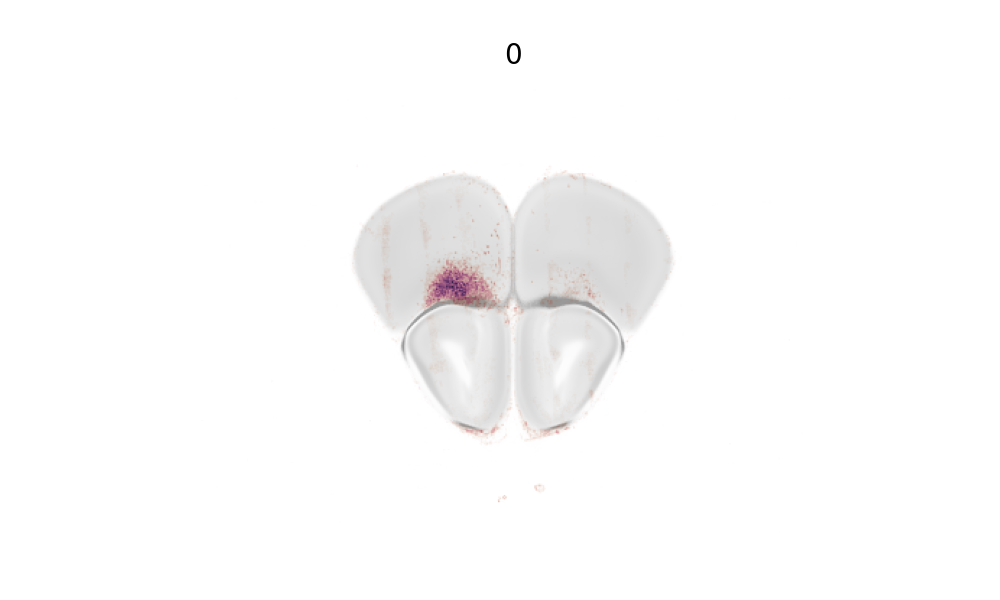

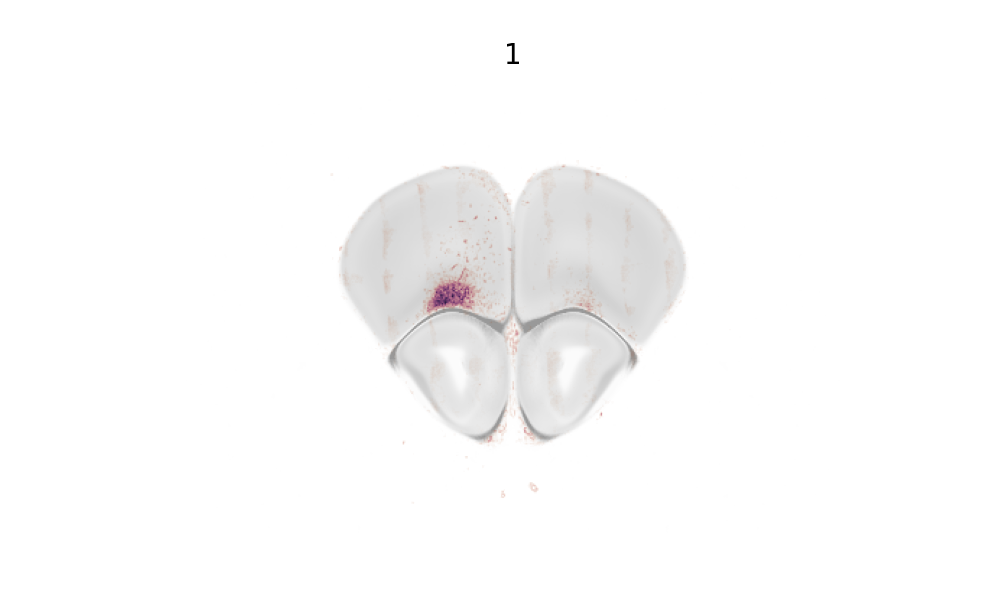

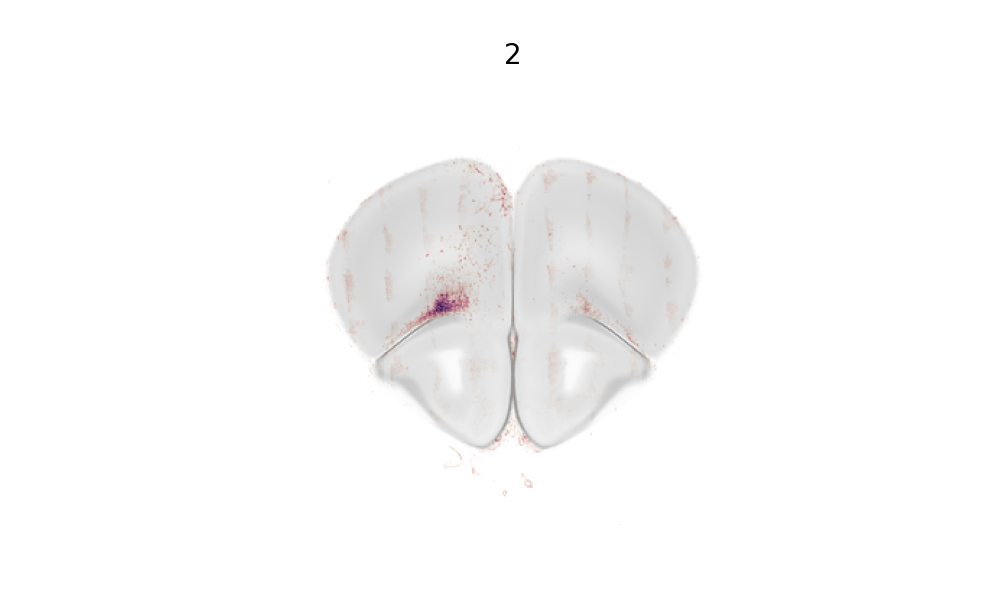

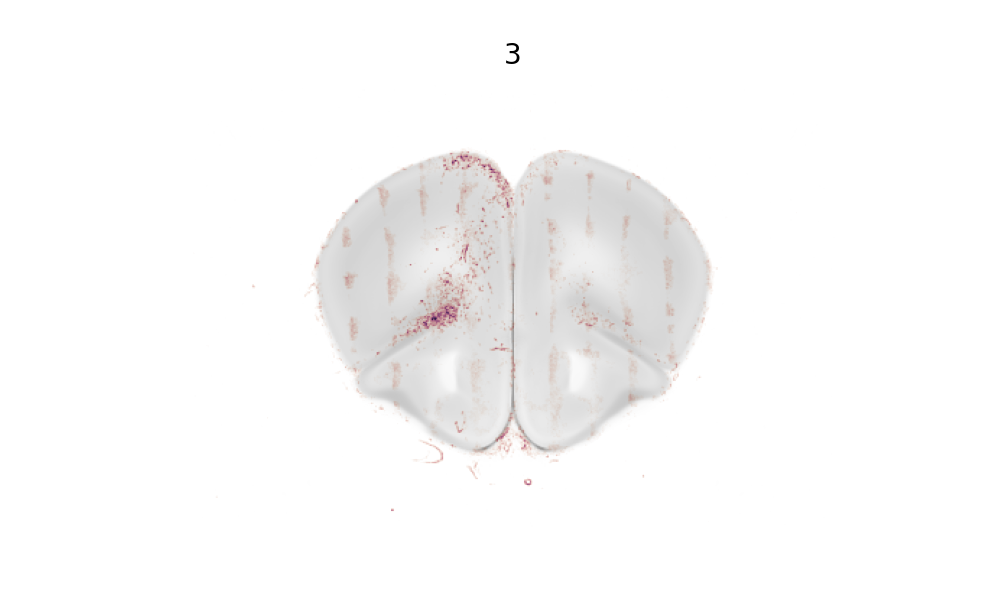

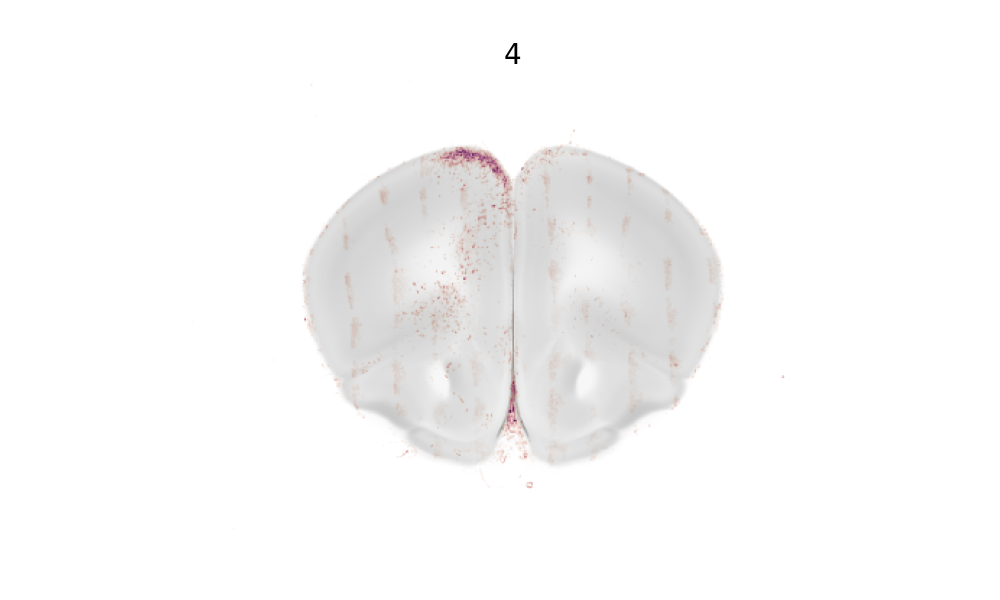

...

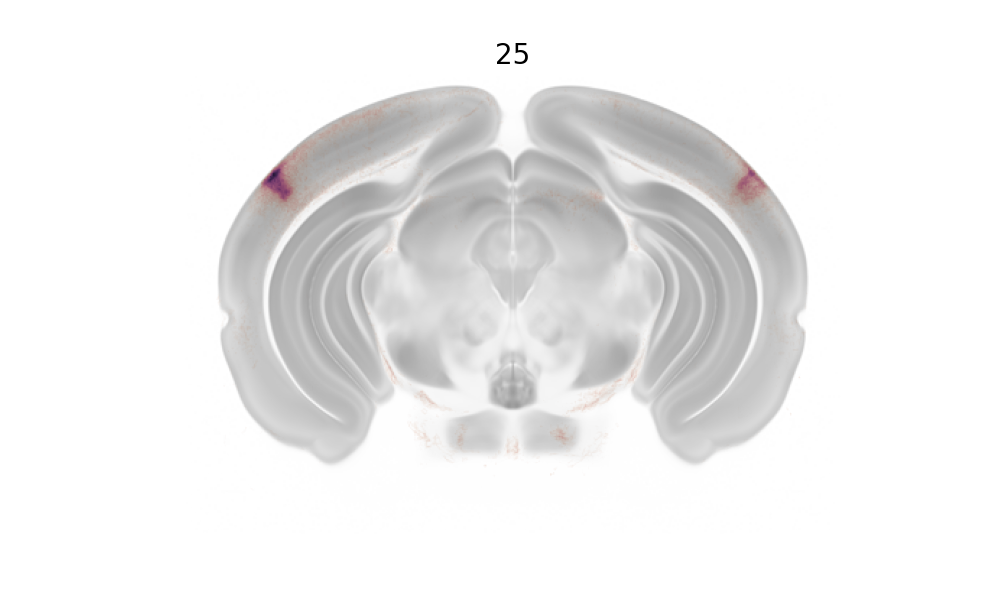

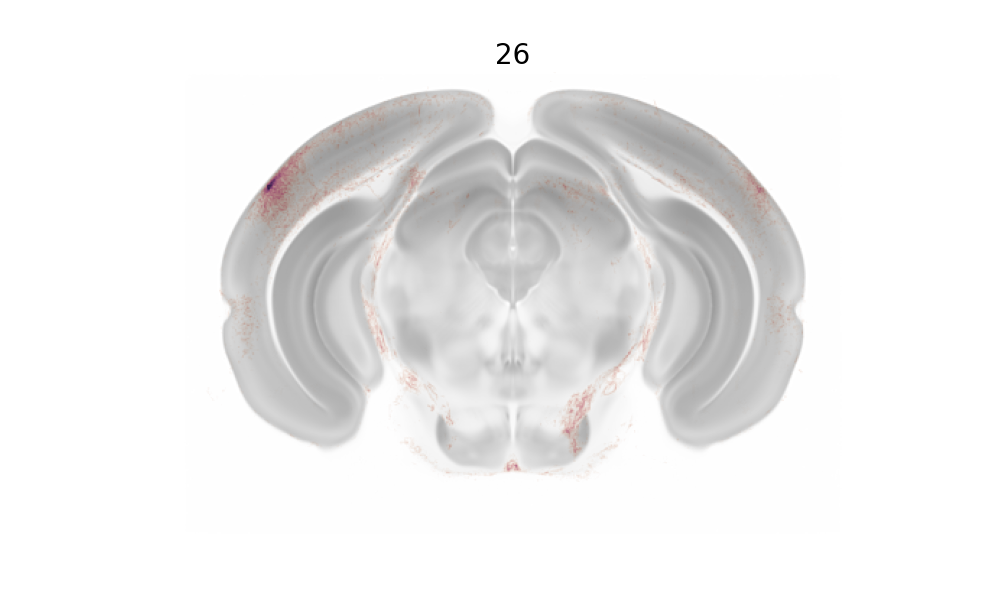

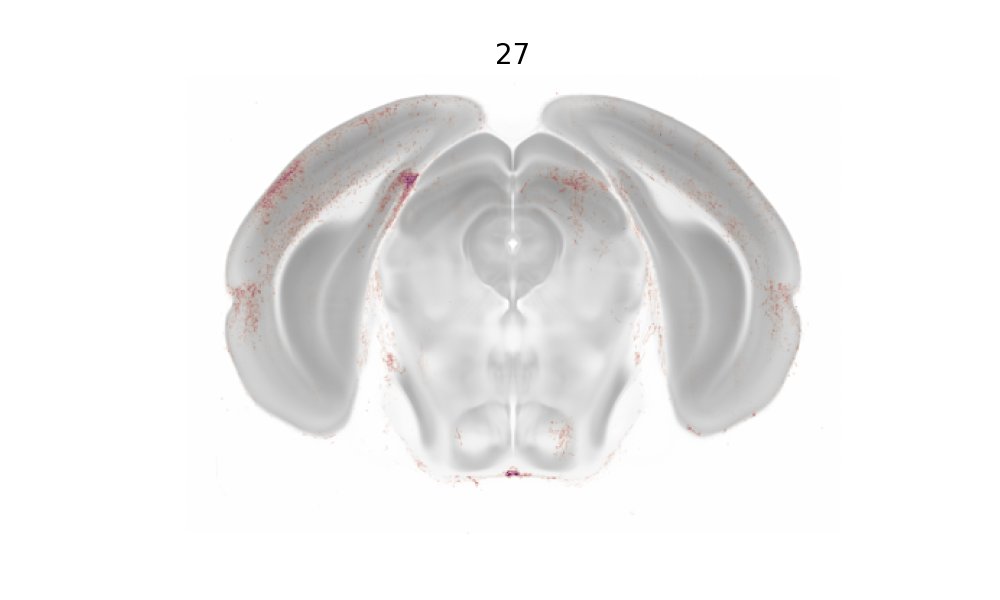

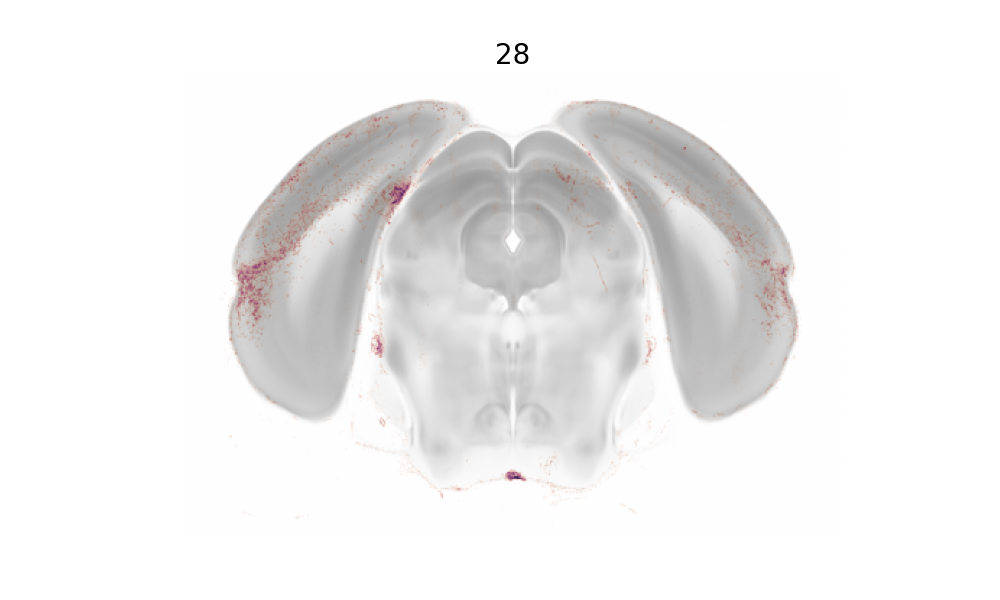

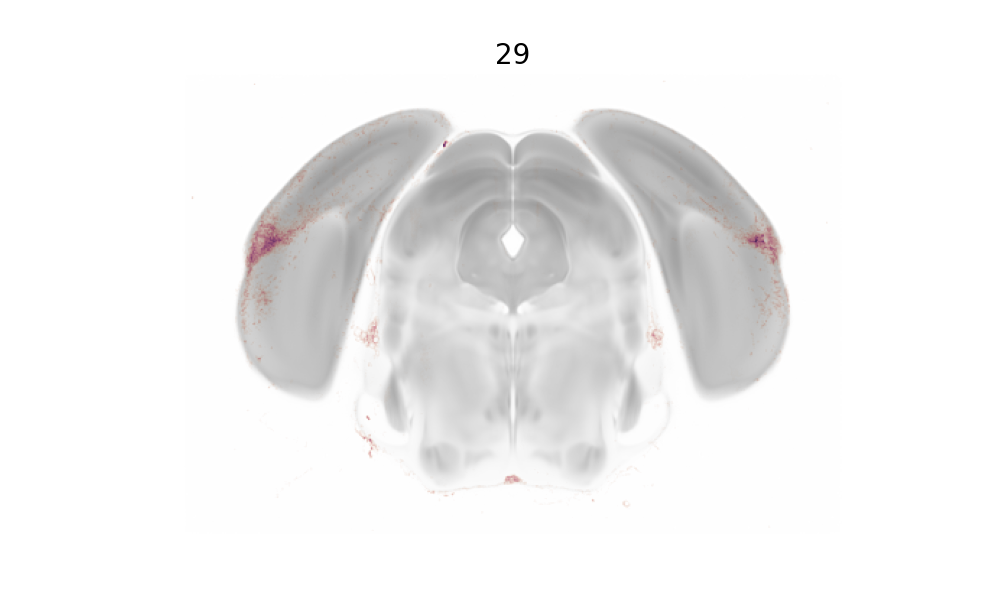

In [28]:
# Create an alpha channel based on weight values
from mpl_toolkits.axes_grid1 import make_axes_locatable


for idx,slice_id  in enumerate(slice_idx):
    cmap = cmap_white2alpha(sns.cubehelix_palette(start=3, light=1, as_cmap=True))
    f, ax = plt.subplots(figsize=(10, 6))
    ax.imshow(template[slice_id,:,:], cmap='gist_yarg', aspect='equal',alpha = 0.4)

    # plot visual 
    im = ax.imshow(IN_projections[idx,:,:], cmap=cmap)
    plt.title(f'{idx}',fontsize = 20)
    #add_cbar(im, ax, inset_loc= (1, .6, 0.05, 0.2),title = 'VISrl',ticks=(.05,.3),ticklabels = ('Low','High'))
    ax.contour(OUT_mask[slice_id,:,:],[0], colors='0', linewidths= 1)
    ax.contour(IN_mask[slice_id,:,:],[0], colors='0', linewidths= 1)
    ax.axis('off')
            
    now = datetime.now()
    dt_string = now.strftime("%d%m%Y_time_%H%M")
    inj_area = inj_area.replace(' ', '_')
    print(f'saving plot: {idx+1}/{len(slice_idx)}')
    f.savefig(f'E:\Allen-SDK experiments\plots_projections/VISrl2/slice_{slice_id}_day_{dt_string}.png', format='png', dpi=1000, bbox_inches='tight')


